# Odd-Even MPI Strong Scaling Anaylisis

In [1]:
import sys
sys.path.append("/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages")
sys.path.append("/scratch/group/csce435-f23/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read in all the files

In [2]:
tk = th.Thicket.from_caliperreader(glob("/scratch/user/riley.szecsy/FinalProject/MPI/Odd-EvenSort/CaliFiles//*.cali"))
tk.dataframe = tk.dataframe.drop(["spot.channel"], axis=1)
tk.dataframe = tk.dataframe.drop(["Min time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["Max time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["Total time"],axis=1)
tk.dataframe = tk.dataframe.drop(["Variance time/rank"],axis=1)
tk.dataframe = tk.dataframe.drop(["nid"],axis=1)

In [3]:
# Performance data
tk.dataframe

Avg time/rank  \
node                                              profile                     
{'name': 'main', 'type': 'function'}              5483084         14.360718   
                                                  10341062         0.583057   
                                                  25019965         2.107855   
                                                  41578903         4.122546   
                                                  55064629         3.777966   
                                                  66037327         1.377603   
                                                  66648127         2.005319   
                                                  72663257         2.285582   
                                                  116519970       26.108971   
                                                  127784059        3.222216   
                                                  137943328       17.894742   
                                                  181919278        0.477218   
                                                  185280473        2.904230   
                                                  230675780        3.788698   
                                                  253517045        4.730507   
                                                  256027839        3.935422   
                                                  258680219        0.372019   
                                                  262563229        1.726005   
                                                  269557108        0.814218   
                                                  282096026        0.769289   
                                                  296243770        0.853014   
                                                  296987390        1.498520   
                                                  307496019        0.728392   
                                                  366751633        3.876627   
                                                  392543622        2.075056   
                                                  404647651        1.395362   
                                                  409157698        2.226735   
                                                  418808302        4.271405   
                                                  477492247        0.956236   
                                                  492731890        1.827025   
                                                  506687908        2.030156   
                                                  510000938        3.654587   
                                                  512666979        0.648305   
                                                  513122203       27.579499   
                                                  528960643        2.769196   
                                                  532664040        2.629785   
                                                  572665415        0.656094   
                                                  575628522        1.757653   
                                                  578244390        0.977236   
                                                  586104248        1.683208   
                                                  589101846        1.081856   
                                                  619216921        0.765305   
                                                  645656272        8.244586   
                                                  649869591        4.189951   
                                                  652410820        2.774010   
                                                  667445678        7.494898   
                                                  700529678        8.317620   
                                                  711704166        1.345052   
                                                  713584169        3.845476   
                                 

In [4]:
#Printing Thicket Tree
tk.statsframe.dataframe["time"] = 1
print(tk.tree())

  _____ _     _      _        _   
 |_   _| |__ (_) ___| | _____| |_ 
   | | | '_ \| |/ __| |/ / _ \ __|
   | | | | | | | (__|   <  __/ |_ 
   |_| |_| |_|_|\___|_|\_\___|\__|  v2023.3.0

1.000 main
└─ 1.000 whole_computation
   ├─ 1.000 check_correctness
   ├─ 1.000 comm
   │  └─ 1.000 comm_large
   │     ├─ 1.000 MPI_Gather
   │     ├─ 1.000 MPI_Recv
   │     ├─ 1.000 MPI_Scatter
   │     └─ 1.000 MPI_Send
   ├─ 1.000 comp
   │  └─ 1.000 comp_large
   └─ 1.000 data_init

Legend (Metric: time Min: 1.00 Max: 1.00)
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00
█ 1.00 - 1.00

name User code    ◀  Only in left graph    ▶  Only in right graph



Groupby matrix size argument, available in the metadata (tk.metadata) to organize our performance data into 3 groupings.

In [5]:
tk.metadata

,cali.caliper.version,mpi.world.size,spot.metrics,spot.timeseries.metrics,spot.format.version,spot.options,spot.channels,cali.channel,spot:node.order,spot:output,spot:time.variance,launchdate,libraries,cmdline,cluster,Algorithm,ProgrammingModel,Datatype,SizeOfDatatype,InputSize,InputType,num_procs,group_num,implementation_source
profile,,,,,,,,,,,,,,,,,,,,,,,,
5483084,2.11.0-dev,128,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a268435456-p128-i3.cali,true,1700512650,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 268435456, 3, 128]",c,Odd Even Transposition Sort,MPI,int,4,268435456,1%%perturbed,128,9,Online
10341062,2.11.0-dev,4,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a4194304-p4-i2.cali,true,1700505883,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 4194304, 2, 4]",c,Odd Even Transposition Sort,MPI,int,4,4194304,ReverseSorted,4,9,Online
25019965,2.11.0-dev,256,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p256-i0.cali,true,1700417316,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 1048576, 0, 256]",c,Odd Even Transposition Sort,MPI,int,4,1048576,Sorted,256,9,Online
41578903,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a67108864-p64-i3.cali,true,1700511525,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 67108864, 3, 64]",c,Odd Even Transposition Sort,MPI,int,4,67108864,1%%perturbed,64,9,Online
55064629,2.11.0-dev,1024,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p1024-i0.cali,true,1700417360,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 1048576, 0, 1024]",c,Odd Even Transposition Sort,MPI,int,4,1048576,Sorted,1024,9,Online
66037327,2.11.0-dev,64,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a1048576-p64-i1.cali,true,1700433976,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 1048576, 1, 64]",c,Odd Even Transposition Sort,MPI,int,4,1048576,Random,64,9,Online
66648127,2.11.0-dev,32,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a16777216-p32-i2.cali,true,1700506343,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 16777216, 2, 32]",c,Odd Even Transposition Sort,MPI,int,4,16777216,ReverseSorted,32,9,Online
72663257,2.11.0-dev,512,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a262144-p512-i3.cali,true,1700510184,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 262144, 3, 512]",c,Odd Even Transposition Sort,MPI,int,4,262144,1%%perturbed,512,9,Online
116519970,2.11.0-dev,4,"min#inclusive#sum#time.duration,max#inclusive#...",,2,"time.variance,node.order",regionprofile,spot,true,a268435456-p4-i1.cali,true,1700435304,[/scratch/group/csce435-f23/Caliper/caliper/li...,"[./mpioddeven, 268435456, 1, 4]",c,Odd Even Transposition Sort,MPI,int,4,268435456,Random,4,9,Online


In [6]:
gb = tk.groupby(["InputType", "InputSize"])

28  thickets created...
{('1%%perturbed', 65536): <thicket.thicket.Thicket object at 0x2b1c2be2e5b0>, ('1%%perturbed', 262144): <thicket.thicket.Thicket object at 0x2b1c2bec6f70>, ('1%%perturbed', 1048576): <thicket.thicket.Thicket object at 0x2b1c2bd5c370>, ('1%%perturbed', 4194304): <thicket.thicket.Thicket object at 0x2b1c2bd5edf0>, ('1%%perturbed', 16777216): <thicket.thicket.Thicket object at 0x2b1c2bd5ec10>, ('1%%perturbed', 67108864): <thicket.thicket.Thicket object at 0x2b1c2bca3940>, ('1%%perturbed', 268435456): <thicket.thicket.Thicket object at 0x2b1c2bd1edc0>, ('Random', 65536): <thicket.thicket.Thicket object at 0x2b1c2bf52be0>, ('Random', 262144): <thicket.thicket.Thicket object at 0x2b1c2bd193a0>, ('Random', 1048576): <thicket.thicket.Thicket object at 0x2b1c2bd28220>, ('Random', 4194304): <thicket.thicket.Thicket object at 0x2b1c2bdfb760>, ('Random', 16777216): <thicket.thicket.Thicket object at 0x2b1c2bf21370>, ('Random', 67108864): <thicket.thicket.Thicket object at 0

Compose these 3 groups column-wise to get a holistic view of the data

In [7]:
ctk = th.Thicket.concat_thickets(
    thickets=list(gb.values()),
    headers=list(gb.keys()),
    axis="columns",
    metadata_key="num_procs"
)

In [8]:
ctk.dataframe

(1%%perturbed, 65536)  \
                                                                    Avg time/rank   
node                                              num_procs                         
{'name': 'main', 'type': 'function'}              2                      0.596186   
                                                  4                      0.379166   
                                                  8                      2.633990   
                                                  16                     0.776396   
                                                  32                     1.433996   
                                                  64                     1.758034   
                                                  128                    1.917054   
                                                  256                    1.860386   
                                                  512                    2.405749   
                                                  1024                   3.845476   
{'name': 'whole_computation', 'type': 'function'} 2                      0.009014   
                                                  4                      0.005381   
                                                  8                      0.013052   
                                                  16                     0.008055   
                                                  32                     0.055733   
                                                  64                     0.030749   
                                                  128                    0.076449   
                                                  256                    0.071774   
                                                  512                    0.136486   
                                                  1024                   0.295999   
{'name': 'check_correctness', 'type': 'function'} 2                      0.000209   
                                                  4                      0.000187   
                                                  8                      0.000174   
                                                  16                     0.000186   
                                                  32                     0.000186   
                                                  64                     0.000178   
                                                  128                    0.000177   
                                                  256                    0.000179   
                                                  512                    0.000178   
                                                  1024                   0.000175   
{'name': 'comm', 'type': 'function'}              2                      0.003141   
                                                  4                      0.001725   
                                                  8                      0.009888   
                                                  16                     0.005155   
                                                  32                     0.053041   
                                                  64                     0.027624   
                                                  128                    0.072562   
                                                  256                    0.066439   
                                                  512                    0.128007   
                                                  1024                   0.281029   
{'name': 'comm_large', 'type': 'function'}        2                      0.003102   
                                                  4                      0.001665   
                                                  8                      0.009776   
                                                  16                     0.004955   
                                                  32             

Perform pandas operations to get the table in a desirable format for plotting

In [9]:
# Drop unwanted columns
#ctk.dataframe = ctk.dataframe.reset_index().drop([("node", ""), (("1%%perturbed",65536), "nid"), (("1%%perturbed",65536),"Min time/rank"), (("1%%perturbed",65536),"Max time/rank"), (("1%%perturbed",65536),"Total time"), (("1%%perturbed",65536),"Variance time/rank"), (("Random",65536),"nid"), (("Random",65536),"Min time/rank"), (("Random",65536),"Max time/rank"), (("Random",65536),"Total time"), (("Random",65536),"Variance time/rank"),(("Sorted",65536),"nid"),(("Sorted",65536),"Min time/rank"), (("Sorted",65536),"Max time/rank"), (("Sorted",65536),"Total time"), (("Sorted",65536),"Variance time/rank"),(("ReverseSorted",65536),"nid"),(("ReverseSorted",65536),"Min time/rank"), (("ReverseSorted",65536),"Max time/rank"), (("ReverseSorted",65536),"Total time"), (("ReverseSorted",65536),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",262144), "nid"), (("1%%perturbed",262144),"Min time/rank"), (("1%%perturbed",262144),"Max time/rank"), (("1%%perturbed",262144),"Total time"), (("1%%perturbed",262144),"Variance time/rank"), (("Random",262144),"nid"), (("Random",262144),"Min time/rank"), (("Random",262144),"Max time/rank"), (("Random",262144),"Total time"), (("Random",262144),"Variance time/rank"),(("Sorted",262144),"nid"),(("Sorted",262144),"Min time/rank"), (("Sorted",262144),"Max time/rank"), (("Sorted",262144),"Total time"), (("Sorted",262144),"Variance time/rank"),(("ReverseSorted",262144),"nid"),(("ReverseSorted",262144),"Min time/rank"), (("ReverseSorted",262144),"Max time/rank"), (("ReverseSorted",262144),"Total time"), (("ReverseSorted",262144),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.reset_index().drop([(("1%%perturbed",1048576), "nid"), (("1%%perturbed",1048576),"Min time/rank"), (("1%%perturbed",1048576),"Max time/rank"), (("1%%perturbed",1048576),"Total time"), (("1%%perturbed",1048576),"Variance time/rank"), (("Random",1048576),"nid"), (("Random",1048576),"Min time/rank"), (("Random",1048576),"Max time/rank"), (("Random",1048576),"Total time"), (("Random",1048576),"Variance time/rank"),(("Sorted",1048576),"nid"),(("Sorted",1048576),"Min time/rank"), (("Sorted",1048576),"Max time/rank"), (("Sorted",1048576),"Total time"), (("Sorted",1048576),"Variance time/rank"),(("ReverseSorted",1048576),"nid"),(("ReverseSorted",1048576),"Min time/rank"), (("ReverseSorted",1048576),"Max time/rank"), (("ReverseSorted",1048576),"Total time"), (("ReverseSorted",1048576),"Variance time/rank") ], axis=1)
#ctk.dataframe = ctk.dataframe.drop([("index","")], axis=1)

ctk.dataframe = ctk.dataframe.reset_index().drop([("node", "")], axis=1)
ctk.dataframe = ctk.dataframe.rename({("name", ""): "name", ("num_procs", ""): "num_procs"}).set_index(["name", "num_procs"])


In [10]:
ctk.dataframe

(1%%perturbed, 65536) (1%%perturbed, 262144)  \
                                    Avg time/rank          Avg time/rank   
name              num_procs                                                
main              2                      0.596186               0.612037   
                  4                      0.379166               0.389464   
                  8                      2.633990               0.503474   
                  16                     0.776396               0.804248   
                  32                     1.433996               1.451457   
                  64                     1.758034               1.726005   
                  128                    1.917054               2.039742   
                  256                    1.860386               1.736576   
                  512                    2.405749               2.285582   
                  1024                   3.845476               3.782143   
whole_computation 2                      0.009014               0.028852   
                  4                      0.005381               0.021298   
                  8                      0.013052               0.015692   
                  16                     0.008055               0.014954   
                  32                     0.055733               0.059867   
                  64                     0.030749               0.027871   
                  128                    0.076449               0.062510   
                  256                    0.071774               0.097897   
                  512                    0.136486               0.143477   
                  1024                   0.295999               0.352210   
check_correctness 2                      0.000209               0.000681   
                  4                      0.000187               0.000675   
                  8                      0.000174               0.000702   
                  16                     0.000186               0.000687   
                  32                     0.000186               0.000709   
                  64                     0.000178               0.000696   
                  128                    0.000177               0.000696   
                  256                    0.000179               0.000696   
                  512                    0.000178               0.000711   
                  1024                   0.000175               0.000705   
comm              2                      0.003141               0.006047   
                  4                      0.001725               0.005559   
                  8                      0.009888               0.004095   
                  16                     0.005155               0.004417   
                  32                     0.053041               0.050528   
                  64                     0.027624               0.018396   
                  128                    0.072562               0.052135   
                  256                    0.066439               0.086574   
                  512                    0.128007               0.128875   
                  1024                   0.281029               0.330228   
comm_large        2                      0.003102               0.006007   
                  4                      0.001665               0.005492   
                  8                      0.009776               0.003988   
                  16                     0.004955               0.004221   
                  32                     0.052639               0.050145   
                  64                     0.026892               0.017662   
                  128                    0.071117               0.050691   
                  256                    0.063576               0.083708   
                  512                    0.122302               0.123160   
                  1024                   0.269643               0.318831   


In [11]:
# Define common variables
function_names = set(ctk.dataframe.index.get_level_values("name"))
threads = sorted(list(set(ctk.dataframe.index.get_level_values("num_procs"))))
inputsizes = sorted(list(set(tk.metadata["InputSize"].to_list())))
inputtypes = sorted(list(set(tk.metadata["InputType"].to_list())))

In [12]:
ctk.dataframe

(1%%perturbed, 65536) (1%%perturbed, 262144)  \
                                    Avg time/rank          Avg time/rank   
name              num_procs                                                
main              2                      0.596186               0.612037   
                  4                      0.379166               0.389464   
                  8                      2.633990               0.503474   
                  16                     0.776396               0.804248   
                  32                     1.433996               1.451457   
                  64                     1.758034               1.726005   
                  128                    1.917054               2.039742   
                  256                    1.860386               1.736576   
                  512                    2.405749               2.285582   
                  1024                   3.845476               3.782143   
whole_computation 2                      0.009014               0.028852   
                  4                      0.005381               0.021298   
                  8                      0.013052               0.015692   
                  16                     0.008055               0.014954   
                  32                     0.055733               0.059867   
                  64                     0.030749               0.027871   
                  128                    0.076449               0.062510   
                  256                    0.071774               0.097897   
                  512                    0.136486               0.143477   
                  1024                   0.295999               0.352210   
check_correctness 2                      0.000209               0.000681   
                  4                      0.000187               0.000675   
                  8                      0.000174               0.000702   
                  16                     0.000186               0.000687   
                  32                     0.000186               0.000709   
                  64                     0.000178               0.000696   
                  128                    0.000177               0.000696   
                  256                    0.000179               0.000696   
                  512                    0.000178               0.000711   
                  1024                   0.000175               0.000705   
comm              2                      0.003141               0.006047   
                  4                      0.001725               0.005559   
                  8                      0.009888               0.004095   
                  16                     0.005155               0.004417   
                  32                     0.053041               0.050528   
                  64                     0.027624               0.018396   
                  128                    0.072562               0.052135   
                  256                    0.066439               0.086574   
                  512                    0.128007               0.128875   
                  1024                   0.281029               0.330228   
comm_large        2                      0.003102               0.006007   
                  4                      0.001665               0.005492   
                  8                      0.009776               0.003988   
                  16                     0.004955               0.004221   
                  32                     0.052639               0.050145   
                  64                     0.026892               0.017662   
                  128                    0.071117               0.050691   
                  256                    0.063576               0.083708   
                  512                    0.122302               0.123160   
                  1024                   0.269643               0.318831   


# Plotting (From the lab 1 example)

### Option 1
Use `pandas.DataFrame.plot` to automatically interface with matplotlib

In [13]:
def plot_pandas(df, title, xlabel, ylabel, loglog):
    plot = df.plot(kind="line", 
        marker='o', 
        title=title, 
        xlabel=xlabel,
        ylabel=ylabel, 
        grid=True,
        loglog=loglog
    )
    return plot

### Option 2
Use `matplotlib.pyplot` directly for more fine-grained control. Specifically for our case we can change the x axis scaling from base 10 to base 2.

In [14]:
def plot_mpl(df, title, xlabel, ylabel):
    fig = plt.figure()
    ax = fig.add_subplot(1, 1, 1)
    ax.plot(
        df,
        marker='o',
    )
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.legend(matrix_sizes)
    plt.grid(True)
    plt.yscale("log", base=2)
    plt.xscale("log", base=2)
    plt.xticks(threads)
    plt.show()
    return fig, ax

# Graphs

In [15]:
ctk.dataframe.loc["main"]

,"(1%%perturbed, 65536)","(1%%perturbed, 262144)","(1%%perturbed, 1048576)","(1%%perturbed, 4194304)","(1%%perturbed, 16777216)","(1%%perturbed, 67108864)","(1%%perturbed, 268435456)","(Random, 65536)","(Random, 262144)","(Random, 1048576)","(Random, 4194304)","(Random, 16777216)","(Random, 67108864)","(Random, 268435456)","(ReverseSorted, 65536)","(ReverseSorted, 262144)","(ReverseSorted, 1048576)","(ReverseSorted, 4194304)","(ReverseSorted, 16777216)","(ReverseSorted, 67108864)","(ReverseSorted, 268435456)","(Sorted, 65536)","(Sorted, 262144)","(Sorted, 1048576)","(Sorted, 4194304)","(Sorted, 16777216)","(Sorted, 67108864)","(Sorted, 268435456)"
,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank,Avg time/rank
num_procs,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,0.596186,0.612037,NaN,0.669275,2.226735,7.494898,30.918978,1.246836,0.526360,0.627163,1.061684,2.668352,10.603124,41.012910,0.586661,0.294846,0.356371,0.609302,1.963648,6.612724,27.579499,0.547352,0.520847,0.695488,0.834728,1.865693,6.126246,25.365773
4,0.379166,0.389464,0.424809,0.653009,1.599636,5.457427,21.658108,0.725225,0.609247,0.450281,0.720597,1.880321,6.828588,26.108971,0.363506,0.377104,0.426766,0.583057,1.297474,4.261306,16.893611,0.360976,0.372019,0.424727,0.582673,1.259662,4.097857,15.849690
8,2.633990,0.503474,0.656094,0.704019,1.397305,4.255636,16.054857,0.477218,0.484863,0.539783,0.977236,1.532131,4.817593,17.894742,0.728392,0.503306,0.753914,0.648305,1.081856,3.023896,10.764128,0.474973,0.483849,NaN,0.626546,1.071981,2.904230,10.409960
16,0.776396,0.804248,0.788431,0.941264,1.543065,3.897077,15.118704,0.774327,0.751450,0.780438,0.956236,1.577740,4.095339,14.212666,0.761980,0.765305,0.769289,0.861608,1.202710,2.629785,8.317620,0.752482,0.746160,0.814218,0.853014,1.207655,2.539432,8.107337
32,1.433996,1.451457,1.395362,1.594166,2.048016,4.193644,12.969775,1.727702,1.371001,1.371612,1.493925,NaN,4.259059,13.188842,1.434568,1.400235,1.399483,1.453491,2.005319,2.922507,7.650842,1.391135,1.345052,1.779267,1.501876,NaN,3.222216,8.282858
64,1.758034,1.726005,1.398204,1.513374,2.050488,4.122546,12.357499,1.358665,1.743112,1.377603,1.906572,2.029648,4.488026,12.198592,1.716772,1.400067,1.418293,1.501007,1.737205,2.774010,7.348983,1.884866,1.342674,2.038552,1.442806,2.075056,2.869232,7.451550
128,1.917054,2.039742,1.520119,1.660054,2.121761,4.444017,14.360718,2.262286,1.498520,1.510896,1.645902,2.385840,4.059459,12.070233,1.867499,1.827025,1.463674,1.550297,1.771929,2.820930,7.029330,2.681840,1.477310,1.941085,1.987049,2.187786,2.840890,7.170429
256,1.860386,1.736576,1.708796,1.823438,2.330761,4.271405,12.280327,2.148862,1.732906,2.163916,1.829957,2.769196,4.211805,11.670300,2.158526,1.683208,1.687023,1.757653,1.940489,3.010845,7.485295,2.153013,1.727092,2.107855,1.787077,2.030156,3.017633,7.168673


In [16]:
#Strong Scaling

/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:509: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


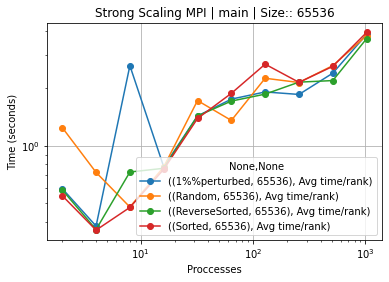

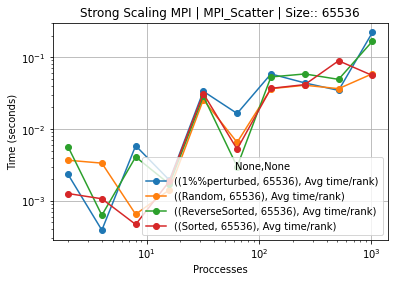

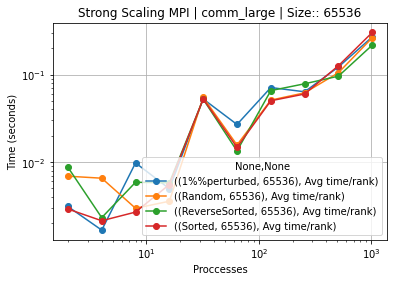

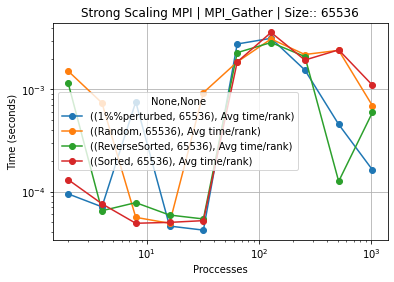

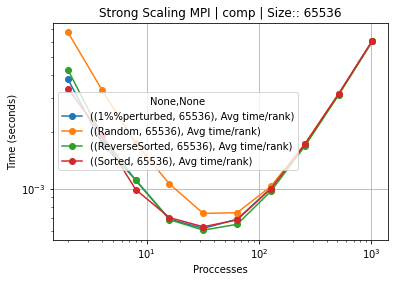

...

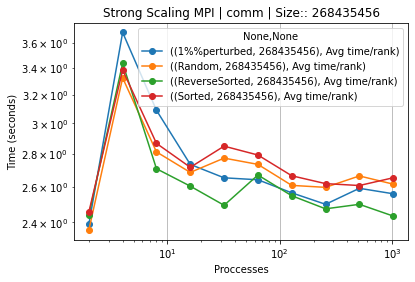

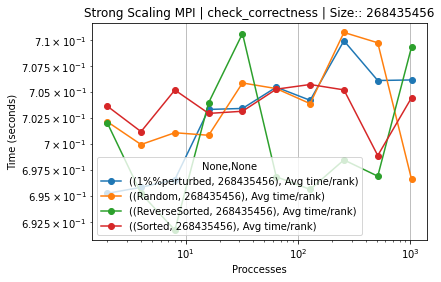

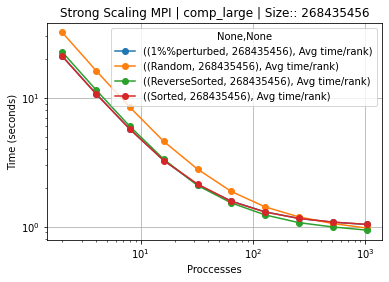

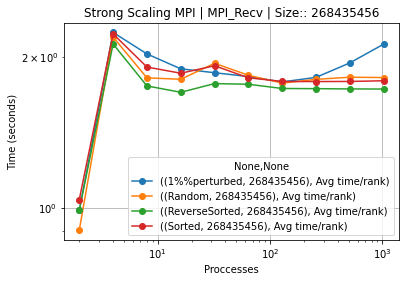

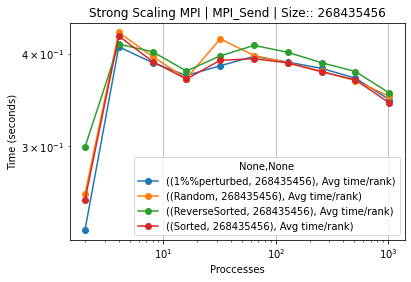

In [17]:
#Plotting Strong Scaling
for size in inputsizes:
    cols = [(inputtype, "Avg time/rank") for inputtype in ctk.dataframe.columns.get_level_values(0) if inputtype[1] == size]
    test = ctk.dataframe[cols]
    for name in function_names:
        plot_pandas(
            df=test.loc[name],
            title=f"Strong Scaling MPI | {name} | Size:: {size}",
            xlabel="Proccesses",
            ylabel="Time (seconds)",
            loglog=True
        )

In [18]:
#Strong Scaling Speedup

In [19]:
ctk.dataframe.loc[("main", 2)]/ctk.dataframe

(1%%perturbed, 65536) (1%%perturbed, 262144)  \
                                    Avg time/rank          Avg time/rank   
name              num_procs                                                
main              2                      1.000000               1.000000   
                  4                      1.572361               1.571485   
                  8                      0.226343               1.215628   
                  16                     0.767889               0.761005   
                  32                     0.415752               0.421671   
                  64                     0.339121               0.354597   
                  128                    0.310991               0.300056   
                  256                    0.320464               0.352439   
                  512                    0.247817               0.267782   
                  1024                   0.155036               0.161823   
whole_computation 2                     66.140004              21.212984   
                  4                    110.794648              28.736830   
                  8                     45.677751              39.003123   
                  16                    74.014401              40.927979   
                  32                    10.697181              10.223278   
                  64                    19.388793              21.959635   
                  128                    7.798480               9.791025   
                  256                    8.306434               6.251846   
                  512                    4.368111               4.265750   
                  1024                   2.014149               1.737705   
check_correctness 2                   2852.564593             898.732746   
                  4                   3188.160428             906.721481   
                  8                   3426.356322             871.847578   
                  16                  3205.301075             890.883552   
                  32                  3205.301075             863.239774   
                  64                  3349.359551             879.363506   
                  128                 3368.282486             879.363506   
                  256                 3330.648045             879.363506   
                  512                 3349.359551             860.811533   
                  1024                3406.777143             868.137589   
comm              2                    189.807705             101.213329   
                  4                    345.615072             110.098399   
                  8                     60.293892             149.459585   
                  16                   115.651988             138.563957   
                  32                    11.240097              12.112829   
                  64                    21.582175              33.270113   
                  128                    8.216229              11.739465   
                  256                    8.973434               7.069524   
                  512                    4.657448               4.749075   
                  1024                   2.121439               1.853377   
comm_large        2                    192.194068             101.887298   
                  4                    358.069670             111.441551   
                  8                     60.984656             153.469659   
                  16                   120.320081             144.998105   
                  32                    11.325937              12.205345   
                  64                    22.169642              34.652757   
                  128                    8.383171              12.073879   
                  256                    9.377532               7.311571   
                  512                    4.874704               4.969446   
                  1024                   2.211020               1.919628   


In [20]:
#Strong Scaling Speedup
speedup_df = ctk.dataframe.loc[("main", 2)]/ctk.dataframe
speedup_df

(1%%perturbed, 65536) (1%%perturbed, 262144)  \
                                    Avg time/rank          Avg time/rank   
name              num_procs                                                
main              2                      1.000000               1.000000   
                  4                      1.572361               1.571485   
                  8                      0.226343               1.215628   
                  16                     0.767889               0.761005   
                  32                     0.415752               0.421671   
                  64                     0.339121               0.354597   
                  128                    0.310991               0.300056   
                  256                    0.320464               0.352439   
                  512                    0.247817               0.267782   
                  1024                   0.155036               0.161823   
whole_computation 2                     66.140004              21.212984   
                  4                    110.794648              28.736830   
                  8                     45.677751              39.003123   
                  16                    74.014401              40.927979   
                  32                    10.697181              10.223278   
                  64                    19.388793              21.959635   
                  128                    7.798480               9.791025   
                  256                    8.306434               6.251846   
                  512                    4.368111               4.265750   
                  1024                   2.014149               1.737705   
check_correctness 2                   2852.564593             898.732746   
                  4                   3188.160428             906.721481   
                  8                   3426.356322             871.847578   
                  16                  3205.301075             890.883552   
                  32                  3205.301075             863.239774   
                  64                  3349.359551             879.363506   
                  128                 3368.282486             879.363506   
                  256                 3330.648045             879.363506   
                  512                 3349.359551             860.811533   
                  1024                3406.777143             868.137589   
comm              2                    189.807705             101.213329   
                  4                    345.615072             110.098399   
                  8                     60.293892             149.459585   
                  16                   115.651988             138.563957   
                  32                    11.240097              12.112829   
                  64                    21.582175              33.270113   
                  128                    8.216229              11.739465   
                  256                    8.973434               7.069524   
                  512                    4.657448               4.749075   
                  1024                   2.121439               1.853377   
comm_large        2                    192.194068             101.887298   
                  4                    358.069670             111.441551   
                  8                     60.984656             153.469659   
                  16                   120.320081             144.998105   
                  32                    11.325937              12.205345   
                  64                    22.169642              34.652757   
                  128                    8.383171              12.073879   
                  256                    9.377532               7.311571   
                  512                    4.874704               4.969446   
                  1024                   2.211020               1.919628   


In [21]:
speedup_df.columns.get_level_values(0)

Index([     ('1%%perturbed', 65536),     ('1%%perturbed', 262144),
          ('1%%perturbed', 1048576),    ('1%%perturbed', 4194304),
         ('1%%perturbed', 16777216),   ('1%%perturbed', 67108864),
        ('1%%perturbed', 268435456),            ('Random', 65536),
                 ('Random', 262144),          ('Random', 1048576),
                ('Random', 4194304),         ('Random', 16777216),
               ('Random', 67108864),        ('Random', 268435456),
           ('ReverseSorted', 65536),    ('ReverseSorted', 262144),
         ('ReverseSorted', 1048576),   ('ReverseSorted', 4194304),
        ('ReverseSorted', 16777216),  ('ReverseSorted', 67108864),
       ('ReverseSorted', 268435456),            ('Sorted', 65536),
                 ('Sorted', 262144),          ('Sorted', 1048576),
                ('Sorted', 4194304),         ('Sorted', 16777216),
               ('Sorted', 67108864),        ('Sorted', 268435456)],
      dtype='object')

In [22]:
#[(inputsize, "Total time") for inputsize in speedup_df.columns.get_level_values(0) if inputsize[0] == intype]

NameError: name 'intype' is not defined

/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages/pandas/plotting/_matplotlib/core.py:509: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


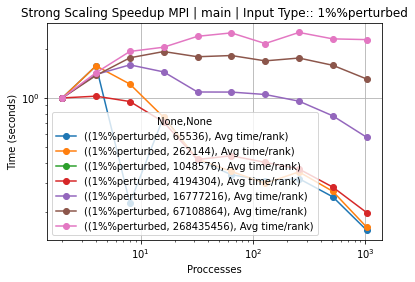

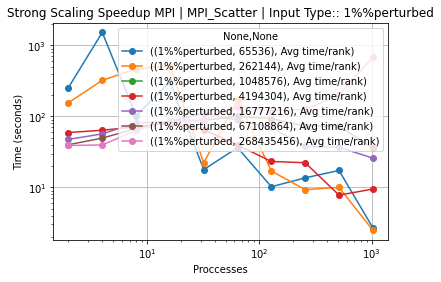

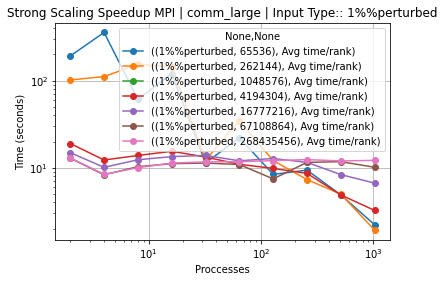

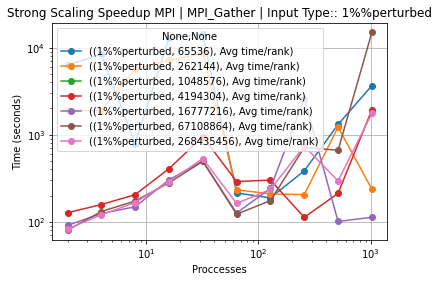

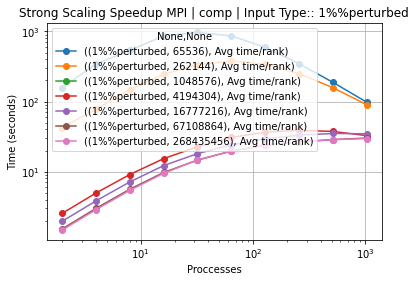

...

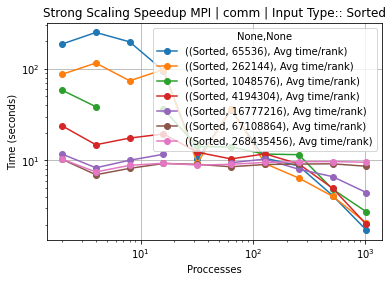

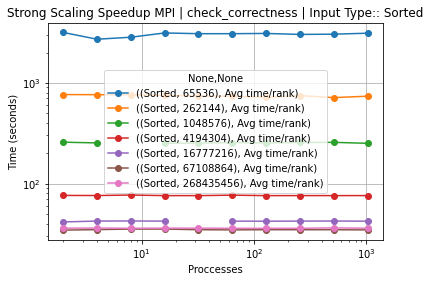

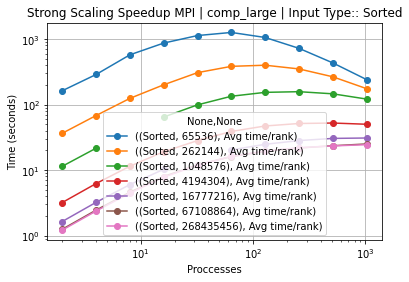

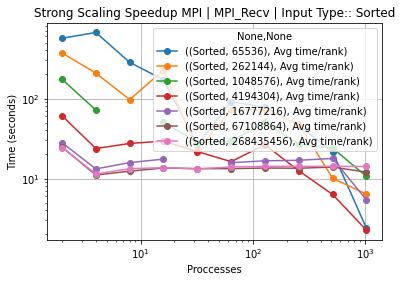

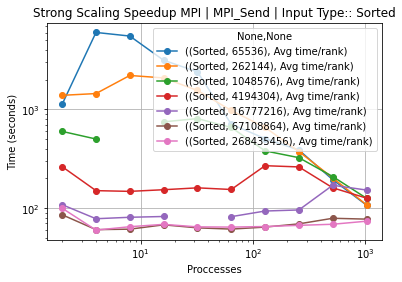

In [23]:
#Plotting Strong Scaling Speedup
for intype in inputtypes:
    cols = [(inputsize, "Avg time/rank") for inputsize in speedup_df.columns.get_level_values(0) if inputsize[0] == intype]
    test = speedup_df[cols]
    for name in function_names:
        plot_pandas(
            df=test.loc[name],
            title=f"Strong Scaling Speedup MPI | {name} | Input Type:: {intype}",
            xlabel="Proccesses",
            ylabel="Time (seconds)",
            loglog=True
        )